Found 3 normal map files: ['1.png', '2.png', '3.png']
Processing 1.png...
  - Shape: (2884, 5448, 3)
  - Average elevation: 43.85° (Median: 47.65°)
  - Average azimuth: -0.79° (Median: 0.25°)
Processing 2.png...
  - Shape: (2884, 5448, 3)
  - Average elevation: 50.59° (Median: 53.92°)
  - Average azimuth: -0.13° (Median: -0.26°)
Processing 3.png...
  - Shape: (2884, 5448, 3)
  - Average elevation: 53.66° (Median: 56.46°)
  - Average azimuth: -1.98° (Median: -0.71°)

Successfully processed 3 normal maps. Generating figures...


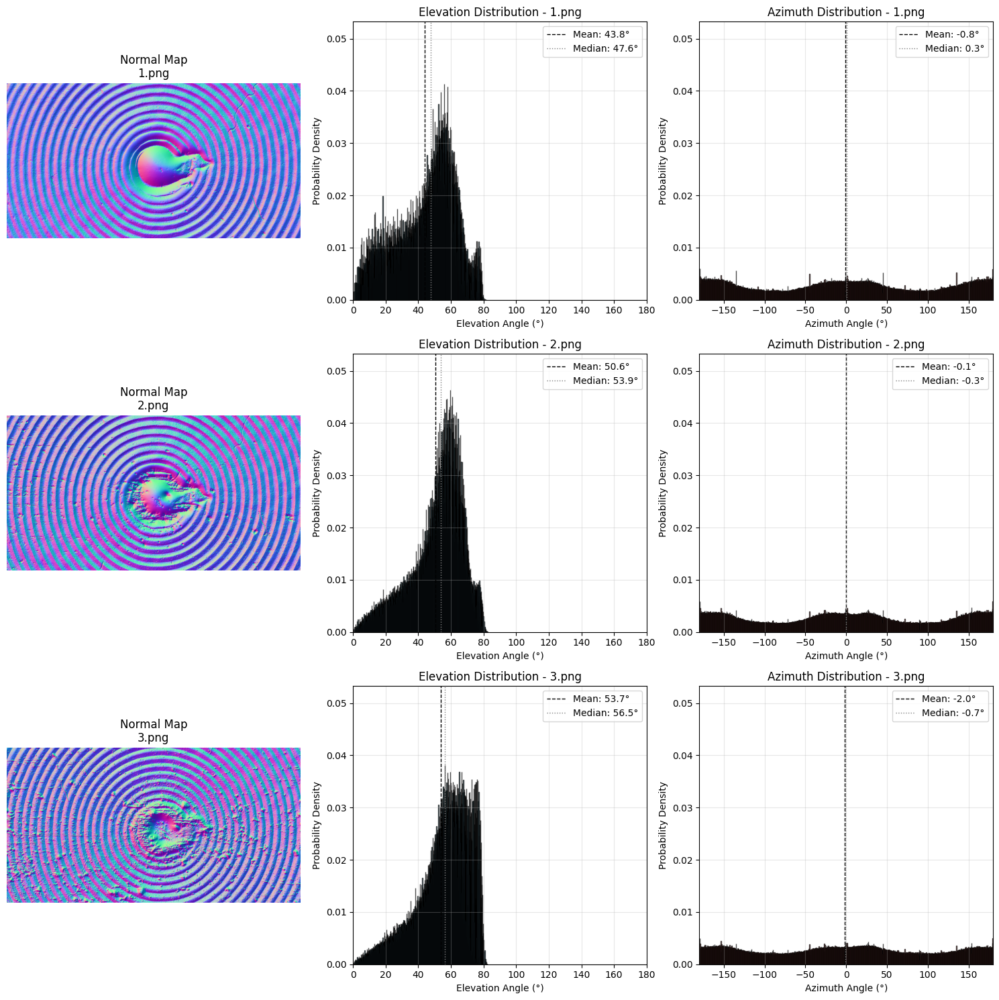

<Figure size 640x480 with 0 Axes>

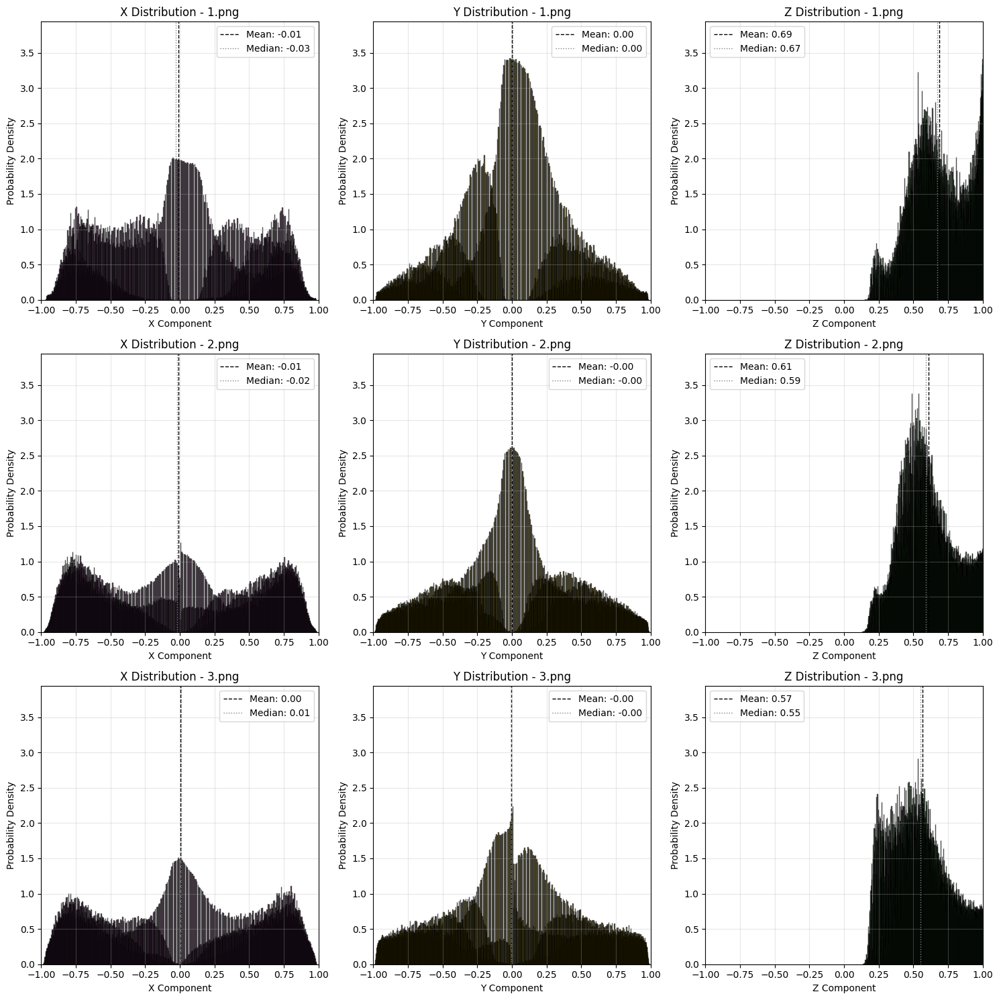

<Figure size 640x480 with 0 Axes>

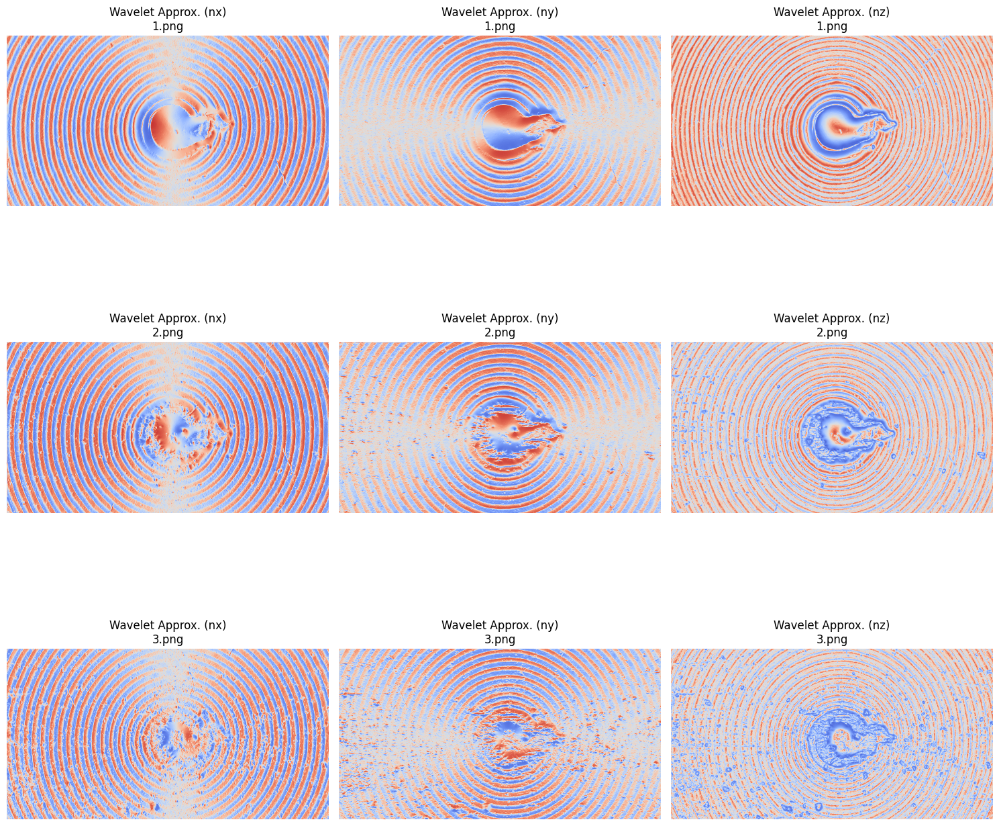

<Figure size 640x480 with 0 Axes>

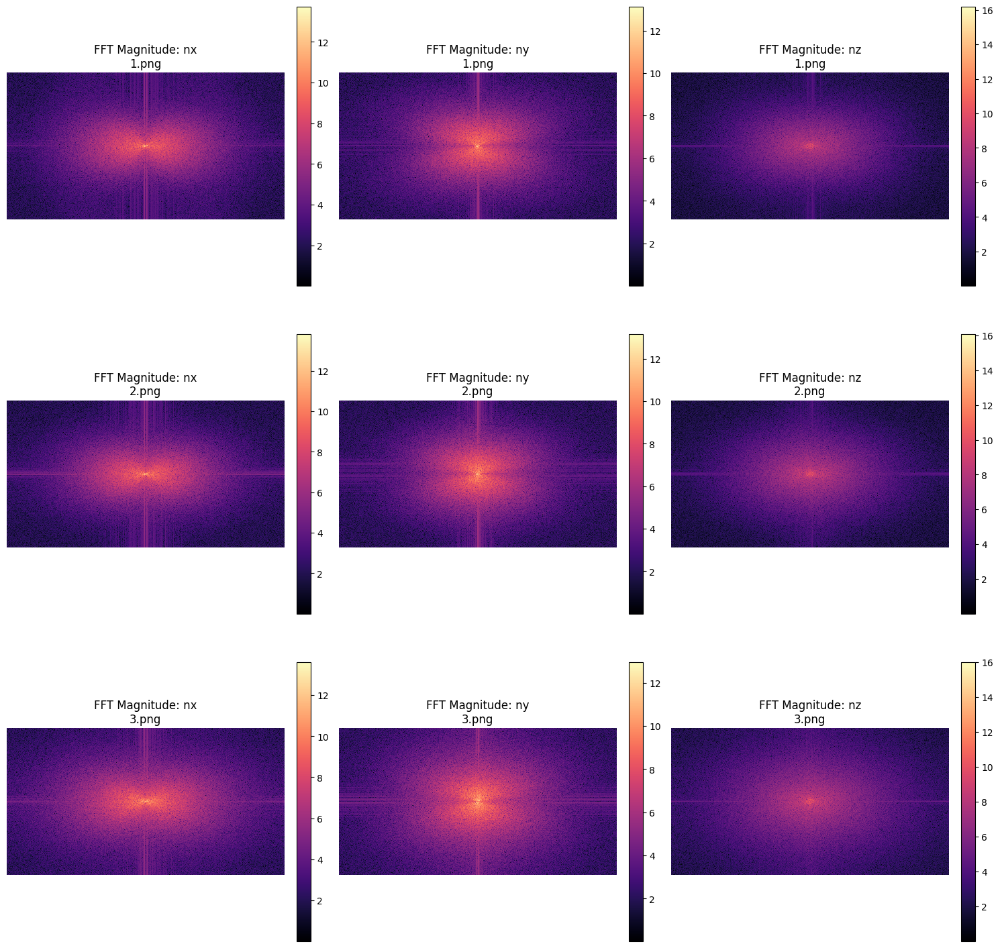


==================== ISO 25178 Parameter Analysis ====================

--- 1.png ---
  Sdq: 0.7013
  Std_Elevation: 17.5305
  Std_Azimuth: 108.4396

--- 2.png ---
  Sdq: 0.7701
  Std_Elevation: 16.0951
  Std_Azimuth: 107.7860

--- 3.png ---
  Sdq: 0.7983
  Std_Elevation: 16.1052
  Std_Azimuth: 105.4194


<Figure size 640x480 with 0 Axes>

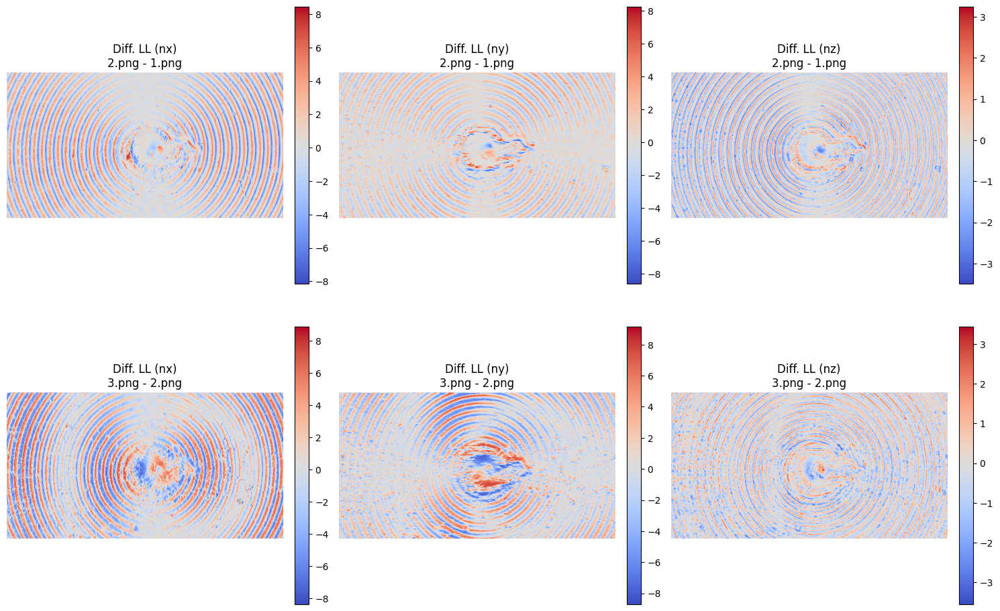

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import glob
import os
from scipy.fft import fft2, fftshift, ifft2, ifftshift
import pywt
from skimage.measure import shannon_entropy
from sklearn.decomposition import PCA
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# ============================
# Constants and Settings
# ============================
FILE_PATTERN = "[1-3].png"  # Looks for "1.png", "2.png", and "3.png"
BINS = 1000  # More bins for finer detail

# Colors for plotting histograms
COLOR_ELEVATION = 'skyblue'
COLOR_AZIMUTH = 'salmon'
COLOR_X = 'orchid'
COLOR_Y = 'gold'
COLOR_Z = 'lightgreen'

# Wavelet parameters
WAVELET_NAME = 'db4'
WAVELET_LEVEL = 2  # More levels for more coefficients

# FFT filter parameters (example)
LOW_CUTOFF_FREQ = 10
HIGH_CUTOFF_FREQ = 50

# Wear simulation parameters (conceptual)
WEAR_LEVELS = [0, 150, 300]  # mm
NORMAL_FORCE_G = 200  # g
NORMAL_FORCE_N = NORMAL_FORCE_G * 9.81 / 1000  # Convert grams to Newtons
WEAR_COEFFICIENT = 1e-6
HARDNESS = 100
SLIDING_DISTANCE = 100

# ============================
# Class: NormalMap
# ============================
class NormalMap:
    """
    Process a normal map image:
      - Loads the image and converts it from BGR to RGB.
      - Normalizes pixel values to the range [-1,1].
      - Extracts the x, y, z components.
      - Computes spherical coordinates:
          theta: elevation angle (in radians and degrees)
          phi: azimuth angle in the x-y plane [-pi, pi]
    """
    def __init__(self, file_path: str):
        self.file_path = file_path
        self.img = None          # Original RGB image
        self.normals = None      # Normalized image (values in [-1, 1])
        self.nx = None           # X component
        self.ny = None           # Y component
        self.nz = None           # Z component
        self.theta = None        # Elevation (radians)
        self.phi = None          # Azimuth (radians)
        self.theta_deg = None    # Elevation in degrees
        self.phi_deg = None      # Azimuth in degrees
        self.fft_result = None   # FFT (complex array)
        self.fft_magnitude = None # FFT magnitude spectrum
        self.wavelet_coeffs = None # Wavelet coefficients

    def load_and_normalize(self) -> None:
        """Load image, convert to RGB, and normalize pixel values to [-1, 1]."""
        img = cv2.imread(self.file_path, cv2.IMREAD_COLOR)
        if img is None:
            raise IOError(f"Image not found: {self.file_path}")
        self.img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_float = self.img.astype(np.float32) / 255.0
        self.normals = img_float * 2.0 - 1.0

    @staticmethod
    def normalize_vectors(nx: np.ndarray, ny: np.ndarray, nz: np.ndarray) -> tuple:
        """Normalize vector components to unit length."""
        magnitude = np.sqrt(nx**2 + ny**2 + nz**2)
        magnitude[magnitude == 0] = 1.0  # avoid division by zero
        return nx / magnitude, ny / magnitude, nz / magnitude

    @staticmethod
    def compute_spherical(nx: np.ndarray, ny: np.ndarray, nz: np.ndarray) -> tuple:
        """
        Compute spherical coordinates:
          - theta: angle between vertical (z) and the normal [0, pi]
          - phi: azimuth angle in the x-y plane [-pi, pi]
        """
        theta = np.arccos(nz)
        phi = np.arctan2(ny, nx)
        return theta, phi

    def perform_fft(self) -> None:
        """Perform 2D FFT on the normal components."""
        self.fft_result = {}
        self.fft_magnitude = {}
        for component_name, component_data in zip(['nx', 'ny', 'nz'],
                                                    [self.nx, self.ny, self.nz]):
            if component_data is not None:
                fft_result = fft2(component_data)
                self.fft_result[component_name] = fft_result
                fft_shifted = fftshift(np.abs(fft_result))
                self.fft_magnitude[component_name] = np.log(1 + fft_shifted)

    def apply_fft_filter(self, component_name: str,
                         low_cutoff: int = LOW_CUTOFF_FREQ,
                         high_cutoff: int = HIGH_CUTOFF_FREQ) -> np.ndarray:
        """Apply a bandpass filter in the frequency domain."""
        if component_name not in self.fft_result:
            return None
        fft_shifted = fftshift(self.fft_result[component_name])
        rows, cols = fft_shifted.shape
        crow, ccol = rows // 2, cols // 2

        mask = np.zeros_like(fft_shifted, dtype=bool)
        for i in range(rows):
            for j in range(cols):
                d = np.sqrt((i - crow)**2 + (j - ccol)**2)
                if low_cutoff <= d <= high_cutoff:
                    mask[i, j] = True

        filtered_fft_shifted = fft_shifted * mask
        filtered_fft = ifftshift(filtered_fft_shifted)
        filtered_image = np.real(ifft2(filtered_fft))
        return filtered_image

    def perform_wavelet_analysis(self, level: int = WAVELET_LEVEL) -> None:
        """Perform multi-level 2D Discrete Wavelet Transform."""
        self.wavelet_coeffs = {}
        for component_name, component_data in zip(['nx', 'ny', 'nz'],
                                                    [self.nx, self.ny, self.nz]):
            if component_data is not None:
                coeffs = pywt.wavedec2(component_data, WAVELET_NAME, level=level, mode='periodization')
                self.wavelet_coeffs[component_name] = coeffs

    def reconstruct_wavelet(self, component_name: str, detail_coeffs_to_zero=None) -> np.ndarray:
        """
        Reconstruct image from wavelet coefficients,
        optionally zeroing out specified detail coefficients.
        """
        if component_name not in self.wavelet_coeffs:
            return None
        coeffs = self.wavelet_coeffs[component_name]
        if detail_coeffs_to_zero is not None:
            new_coeffs = [coeffs[0]] + [
                (np.zeros_like(d[0]), np.zeros_like(d[1]), np.zeros_like(d[2]))
                if i in detail_coeffs_to_zero else d
                for i, d in enumerate(coeffs[1:])
            ]
            return pywt.waverec2(new_coeffs, WAVELET_NAME, mode='periodization')
        return pywt.waverec2(coeffs, WAVELET_NAME, mode='periodization')

    def process(self) -> None:
        """Execute full processing pipeline for the normal map."""
        self.load_and_normalize()
        self.nx = self.normals[..., 0]
        self.ny = self.normals[..., 1]
        self.nz = self.normals[..., 2]
        self.nx, self.ny, self.nz = NormalMap.normalize_vectors(self.nx, self.ny, self.nz)
        self.theta, self.phi = NormalMap.compute_spherical(self.nx, self.ny, self.nz)
        self.theta_deg = np.degrees(self.theta)
        self.phi_deg = np.degrees(self.phi)
        self.perform_fft()
        self.perform_wavelet_analysis()

    def calculate_iso_25178_parameters(self) -> dict:
        """Calculate ISO 25178 surface parameters (adapted for normal maps)."""
        parameters = {}
        if self.nx is not None and self.ny is not None:
            Sdq = np.sqrt(np.mean(self.nx**2 + self.ny**2))
            parameters['Sdq'] = Sdq

        if self.theta_deg is not None and self.phi_deg is not None:
            parameters['Std_Elevation'] = np.std(self.theta_deg)
            parameters['Std_Azimuth'] = np.std(self.phi_deg)
        return parameters

# ============================
# Class: GraphPlotter
# ============================
class GraphPlotter:
    """
    A collection of static methods to plot:
      - Normal map images with elevation and azimuth histograms.
      - Component histograms (x, y, z).
      - FFT and Wavelet analysis results.
      - ISO 25178 parameter analysis.
      - Comparison of wavelet coefficients.
    """

    @staticmethod
    def get_global_min_max_y(normal_maps, hist_type):
        """Determine global y-axis limits for consistent histogram scales."""
        max_density = 0
        if hist_type == 'elevation':
            for nm in normal_maps:
                hist, _ = np.histogram(nm.theta_deg.flatten(), bins=BINS, density=True)
                max_density = max(max_density, np.max(hist))
        elif hist_type == 'azimuth':
            for nm in normal_maps:
                hist, _ = np.histogram(nm.phi_deg.flatten(), bins=BINS, density=True)
                max_density = max(max_density, np.max(hist))
        elif hist_type == 'x':
            for nm in normal_maps:
                hist, _ = np.histogram(nm.nx.flatten(), bins=BINS, density=True)
                max_density = max(max_density, np.max(hist))
        elif hist_type == 'y':
            for nm in normal_maps:
                hist, _ = np.histogram(nm.ny.flatten(), bins=BINS, density=True)
                max_density = max(max_density, np.max(hist))
        elif hist_type == 'z':
            for nm in normal_maps:
                hist, _ = np.histogram(nm.nz.flatten(), bins=BINS, density=True)
                max_density = max(max_density, np.max(hist))
        max_density *= 1.15  # Buffer for visualization
        return (0, max_density)

    @staticmethod
    def plot_normal_map_histograms(normal_maps: list) -> None:
        """Figure 1: Display each normal map with elevation and azimuth histograms."""
        n_images = len(normal_maps)
        fig, axs = plt.subplots(n_images, 3, figsize=(15, 5 * n_images))
        if n_images == 1:
            axs = np.expand_dims(axs, axis=0)

        elev_ylim = GraphPlotter.get_global_min_max_y(normal_maps, 'elevation')
        azim_ylim = GraphPlotter.get_global_min_max_y(normal_maps, 'azimuth')
        global_max_y = max(elev_ylim[1], azim_ylim[1])
        angle_ylim = (0, global_max_y)

        # Determine consistent zoom for images
        all_heights = []
        all_widths = []
        for nm in normal_maps:
            h, w, _ = nm.img.shape
            all_heights.append(h)
            all_widths.append(w)
        max_height = max(all_heights)
        max_width = max(all_widths)

        for idx, nm in enumerate(normal_maps):
            filename = os.path.basename(nm.file_path)
            # Image display
            ax_img = axs[idx, 0]
            ax_img.imshow(nm.img)
            ax_img.set_title(f"Normal Map\n{filename}")
            h, w, _ = nm.img.shape
            x_center = w / 2
            y_center = h / 2
            ax_img.set_xlim(x_center - max_width/2, x_center + max_width/2)
            ax_img.set_ylim(y_center + max_height/2, y_center - max_height/2)  # Inverted y-axis
            ax_img.set_aspect('equal')
            ax_img.axis("off")

            # Elevation histogram
            ax_elev = axs[idx, 1]
            ax_elev.hist(nm.theta_deg.flatten(), bins=BINS, density=True,
                         color=COLOR_ELEVATION, edgecolor='black', alpha=0.7)
            ax_elev.set_xlabel("Elevation Angle (°)")
            ax_elev.set_ylabel("Probability Density")
            ax_elev.set_title(f"Elevation Distribution - {filename}")
            ax_elev.set_xlim(0, 180)
            ax_elev.set_ylim(*angle_ylim)
            ax_elev.grid(True, alpha=0.3)
            ax_elev.axvline(np.mean(nm.theta_deg), color='black', linestyle='--', linewidth=1,
                            label=f'Mean: {np.mean(nm.theta_deg):.1f}°')
            ax_elev.axvline(np.median(nm.theta_deg), color='gray', linestyle=':', linewidth=1,
                            label=f'Median: {np.median(nm.theta_deg):.1f}°')
            ax_elev.legend()

            # Azimuth histogram
            ax_azim = axs[idx, 2]
            ax_azim.hist(nm.phi_deg.flatten(), bins=BINS, density=True,
                         color=COLOR_AZIMUTH, edgecolor='black', alpha=0.7)
            ax_azim.set_xlabel("Azimuth Angle (°)")
            ax_azim.set_ylabel("Probability Density")
            ax_azim.set_title(f"Azimuth Distribution - {filename}")
            ax_azim.set_xlim(-180, 180)
            ax_azim.set_ylim(*angle_ylim)
            ax_azim.grid(True, alpha=0.3)
            ax_azim.axvline(np.mean(nm.phi_deg), color='black', linestyle='--', linewidth=1,
                            label=f'Mean: {np.mean(nm.phi_deg):.1f}°')
            ax_azim.axvline(np.median(nm.phi_deg), color='gray', linestyle=':', linewidth=1,
                            label=f'Median: {np.median(nm.phi_deg):.1f}°')
            ax_azim.legend()

        plt.tight_layout()
        plt.show()

    @staticmethod
    def plot_component_histograms(normal_maps: list) -> None:
        """Figure 2: Plot histograms for x, y, and z components."""
        n_images = len(normal_maps)
        fig, axs = plt.subplots(n_images, 3, figsize=(15, 5 * n_images))
        if n_images == 1:
            axs = np.expand_dims(axs, axis=0)

        x_ylim = GraphPlotter.get_global_min_max_y(normal_maps, 'x')
        y_ylim = GraphPlotter.get_global_min_max_y(normal_maps, 'y')
        z_ylim = GraphPlotter.get_global_min_max_y(normal_maps, 'z')
        global_max_y = max(x_ylim[1], y_ylim[1], z_ylim[1])
        component_ylim = (0, global_max_y)

        for idx, nm in enumerate(normal_maps):
            filename = os.path.basename(nm.file_path)
            # X component
            ax_x = axs[idx, 0]
            ax_x.hist(nm.nx.flatten(), bins=BINS, density=True,
                      color=COLOR_X, edgecolor='black', alpha=0.7)
            ax_x.set_xlabel("X Component")
            ax_x.set_ylabel("Probability Density")
            ax_x.set_title(f"X Distribution - {filename}")
            ax_x.set_xlim(-1, 1)
            ax_x.set_ylim(*component_ylim)
            ax_x.grid(True, alpha=0.3)
            ax_x.axvline(np.mean(nm.nx), color='black', linestyle='--', linewidth=1,
                         label=f'Mean: {np.mean(nm.nx):.2f}')
            ax_x.axvline(np.median(nm.nx), color='gray', linestyle=':', linewidth=1,
                         label=f'Median: {np.median(nm.nx):.2f}')
            ax_x.legend()

            # Y component
            ax_y = axs[idx, 1]
            ax_y.hist(nm.ny.flatten(), bins=BINS, density=True,
                      color=COLOR_Y, edgecolor='black', alpha=0.7)
            ax_y.set_xlabel("Y Component")
            ax_y.set_ylabel("Probability Density")
            ax_y.set_title(f"Y Distribution - {filename}")
            ax_y.set_xlim(-1, 1)
            ax_y.set_ylim(*component_ylim)
            ax_y.grid(True, alpha=0.3)
            ax_y.axvline(np.mean(nm.ny), color='black', linestyle='--', linewidth=1,
                         label=f'Mean: {np.mean(nm.ny):.2f}')
            ax_y.axvline(np.median(nm.ny), color='gray', linestyle=':', linewidth=1,
                         label=f'Median: {np.median(nm.ny):.2f}')
            ax_y.legend()

            # Z component
            ax_z = axs[idx, 2]
            ax_z.hist(nm.nz.flatten(), bins=BINS, density=True,
                      color=COLOR_Z, edgecolor='black', alpha=0.7)
            ax_z.set_xlabel("Z Component")
            ax_z.set_ylabel("Probability Density")
            ax_z.set_title(f"Z Distribution - {filename}")
            ax_z.set_xlim(-1, 1)
            ax_z.set_ylim(*component_ylim)
            ax_z.grid(True, alpha=0.3)
            ax_z.axvline(np.mean(nm.nz), color='black', linestyle='--', linewidth=1,
                         label=f'Mean: {np.mean(nm.nz):.2f}')
            ax_z.axvline(np.median(nm.nz), color='gray', linestyle=':', linewidth=1,
                         label=f'Median: {np.median(nm.nz):.2f}')
            ax_z.legend()

        plt.tight_layout()
        plt.show()

    @staticmethod
    def plot_wavelet_analysis(normal_maps: list) -> None:
        """Figure 5: Plot the wavelet approximation coefficients."""
        n_images = len(normal_maps)
        fig, axs = plt.subplots(n_images, 3, figsize=(15, 5 * n_images))
        if n_images == 1:
            axs = np.expand_dims(axs, axis=0)
        for idx, nm in enumerate(normal_maps):
            filename = os.path.basename(nm.file_path)
            for i, component in enumerate(['nx', 'ny', 'nz']):
                ax = axs[idx, i]
                if nm.wavelet_coeffs and component in nm.wavelet_coeffs:
                    coeffs = nm.wavelet_coeffs[component]
                    LL = coeffs[0]
                    ax.imshow(LL, cmap='coolwarm')
                    ax.set_title(f"Wavelet Approx. ({component})\n{filename}")
                    ax.axis('off')
                else:
                    ax.set_title(f"Wavelet Data Missing ({component})\n{filename}")
                    ax.axis('off')
        plt.tight_layout()
        plt.show()

    @staticmethod
    def display_iso_25178_parameters(normal_maps: list) -> None:
        """Print ISO 25178 parameters for each normal map."""
        print("\n==================== ISO 25178 Parameter Analysis ====================")
        for nm in normal_maps:
            filename = os.path.basename(nm.file_path)
            parameters = nm.calculate_iso_25178_parameters()
            print(f"\n--- {filename} ---")
            for key, value in parameters.items():
                print(f"  {key}: {value:.4f}")
        print("========================================================================")

    @staticmethod
    def plot_wavelet_difference(normal_maps: list) -> None:
        """Compare wavelet approximation coefficients between consecutive frames."""
        if len(normal_maps) < 2:
            print("Need at least two normal maps to compare wavelet coefficients.")
            return
        num_frames = len(normal_maps)
        fig, axs = plt.subplots(num_frames - 1, 3, figsize=(15, 5 * (num_frames - 1)))
        if num_frames == 2:
            axs = np.expand_dims(axs, axis=0)
        for i in range(num_frames - 1):
            nm1 = normal_maps[i]
            nm2 = normal_maps[i+1]
            filename1 = os.path.basename(nm1.file_path)
            filename2 = os.path.basename(nm2.file_path)
            for j, component in enumerate(['nx', 'ny', 'nz']):
                if (nm1.wavelet_coeffs and component in nm1.wavelet_coeffs and
                    nm2.wavelet_coeffs and component in nm2.wavelet_coeffs):
                    ll1 = nm1.wavelet_coeffs[component][0]
                    ll2 = nm2.wavelet_coeffs[component][0]
                    difference = ll2 - ll1
                    ax = axs[i, j]
                    im = ax.imshow(difference, cmap='coolwarm')
                    ax.set_title(f"Diff. LL ({component})\n{filename2} - {filename1}")
                    ax.axis('off')
                    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
                else:
                    ax = axs[i, j]
                    ax.set_title(f"Wavelet Data Missing ({component})\n{filename2} vs {filename1}")
                    ax.axis('off')
        plt.tight_layout()
        plt.show()

    @staticmethod
    def plot_fft_magnitude(normal_maps: list) -> None:
        """
        Figure 4: Plot the 2D FFT magnitude spectrum for each normal map's
        x, y, and z components.
        """
        n_images = len(normal_maps)
        fig, axs = plt.subplots(n_images, 3, figsize=(15, 5 * n_images))
        if n_images == 1:
            axs = np.array([axs])
        for row_idx, nm in enumerate(normal_maps):
            filename = os.path.basename(nm.file_path)
            for col_idx, component in enumerate(['nx', 'ny', 'nz']):
                ax = axs[row_idx, col_idx]
                if nm.fft_magnitude and component in nm.fft_magnitude:
                    fft_mag = nm.fft_magnitude[component]
                    im = ax.imshow(fft_mag, cmap='magma', origin='lower', interpolation='nearest')
                    ax.set_title(f"FFT Magnitude: {component}\n{filename}")
                    ax.axis('off')
                    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
                else:
                    ax.set_title(f"No FFT data for {component}\n{filename}")
                    ax.axis('off')
        plt.tight_layout()
        plt.show()


# ============================
# Main Script
# ============================
def main():
    # Find all files matching the file pattern.
    normal_map_files = glob.glob(FILE_PATTERN)
    if len(normal_map_files) < 1:
        raise IOError(f"No normal map images found matching pattern '{FILE_PATTERN}'.")
    # Sort files numerically (assumes names like "1.png", "2.png", etc.)
    normal_map_files = sorted(normal_map_files, key=lambda f: int(os.path.splitext(os.path.basename(f))[0]))
    print(f"Found {len(normal_map_files)} normal map files: {normal_map_files}")
    normal_maps = []
    first_normal_map = None
    for file in normal_map_files:
        try:
            print(f"Processing {file}...")
            nm = NormalMap(file)
            nm.process()
            normal_maps.append(nm)
            if file == "1.png":
                first_normal_map = nm
            print(f"  - Shape: {nm.img.shape}")
            print(f"  - Average elevation: {np.mean(nm.theta_deg):.2f}° (Median: {np.median(nm.theta_deg):.2f}°)")
            print(f"  - Average azimuth: {np.mean(nm.phi_deg):.2f}° (Median: {np.median(nm.phi_deg):.2f}°)")
        except Exception as e:
            print(f"Error processing {file}: {e}")
    if not normal_maps:
        print("No valid normal maps to process.")
        return
    print(f"\nSuccessfully processed {len(normal_maps)} normal maps. Generating figures...")
    output_dir = "normal_map_analysis_figures"
    os.makedirs(output_dir, exist_ok=True)
    plt.rcParams['savefig.dpi'] = 300
    plt.rcParams['figure.autolayout'] = True
    GraphPlotter.plot_normal_map_histograms(normal_maps)
    plt.savefig(os.path.join(output_dir, "figure1_normal_map_histograms.png"))
    GraphPlotter.plot_component_histograms(normal_maps)
    plt.savefig(os.path.join(output_dir, "figure2_component_histograms.png"))
    GraphPlotter.plot_wavelet_analysis(normal_maps)
    plt.savefig(os.path.join(output_dir, "figure5_wavelet_approximation.png"))
    GraphPlotter.plot_fft_magnitude(normal_maps)
    plt.savefig(os.path.join(output_dir, "figure4_fft_magnitude.png"))
    GraphPlotter.display_iso_25178_parameters(normal_maps)
    GraphPlotter.plot_wavelet_difference(normal_maps)

if __name__ == "__main__":
    main()


Found 3 normal map files: ['1.png', '2.png', '3.png']
Processing 1.png...
  - Shape: (2884, 5448, 3)
  - Average elevation: 43.85° (Median: 47.65°)
  - Average azimuth: -0.79° (Median: 0.25°)
Processing 2.png...
  - Shape: (2884, 5448, 3)
  - Average elevation: 50.59° (Median: 53.92°)
  - Average azimuth: -0.13° (Median: -0.26°)
Processing 3.png...
  - Shape: (2884, 5448, 3)
  - Average elevation: 53.66° (Median: 56.46°)
  - Average azimuth: -1.98° (Median: -0.71°)

Successfully processed 3 normal maps. Generating figures...


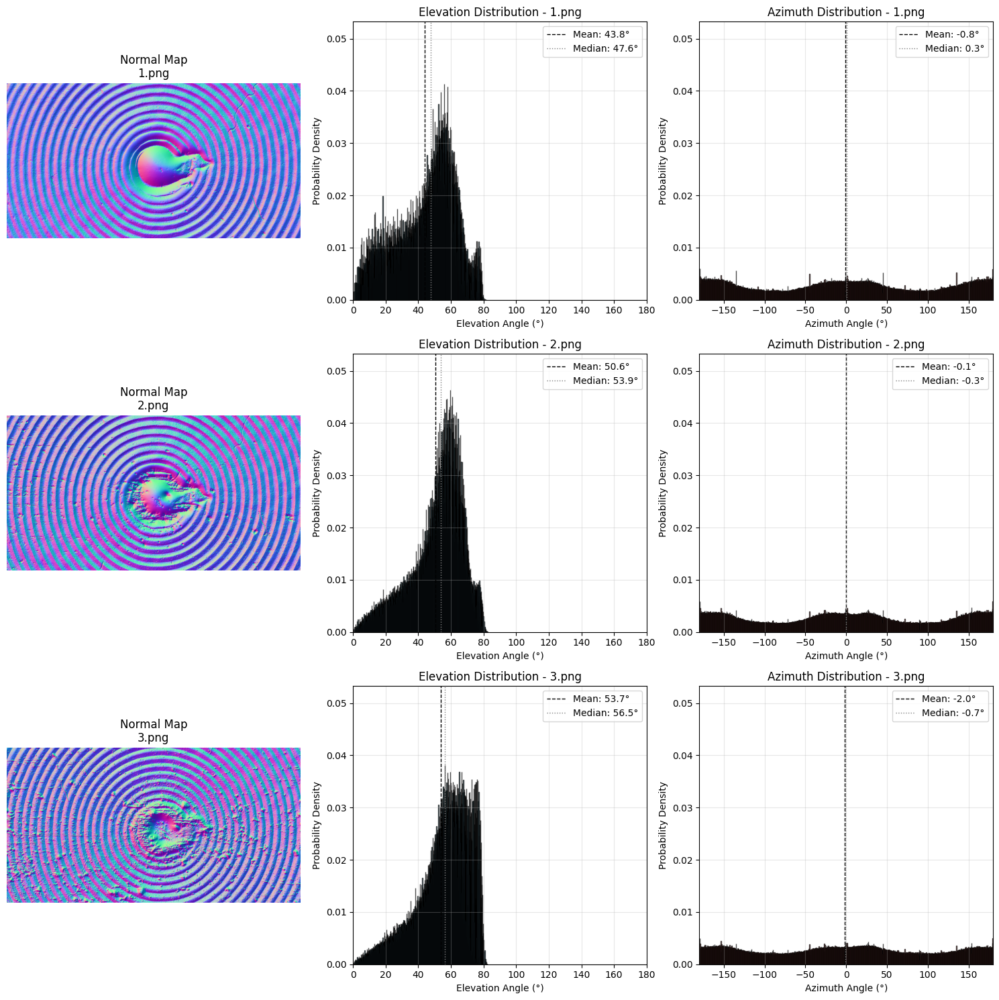

<Figure size 640x480 with 0 Axes>

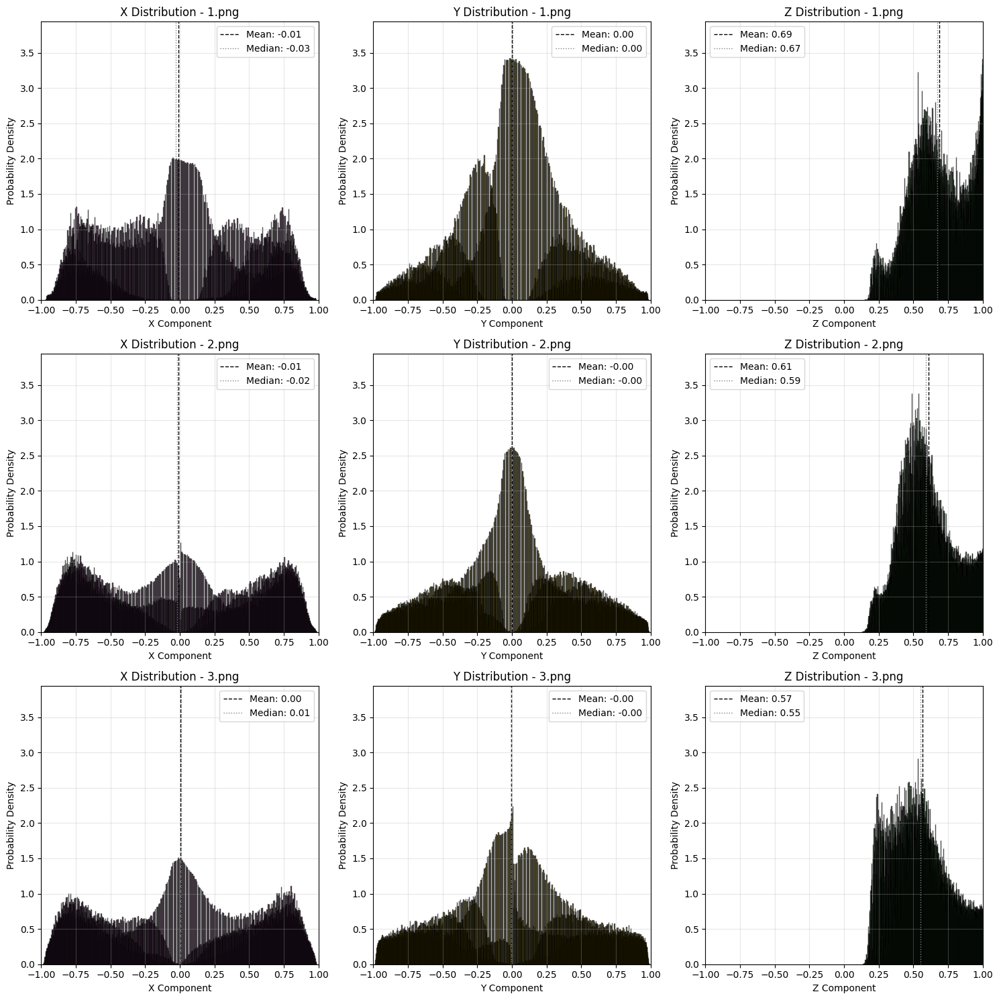

<Figure size 640x480 with 0 Axes>

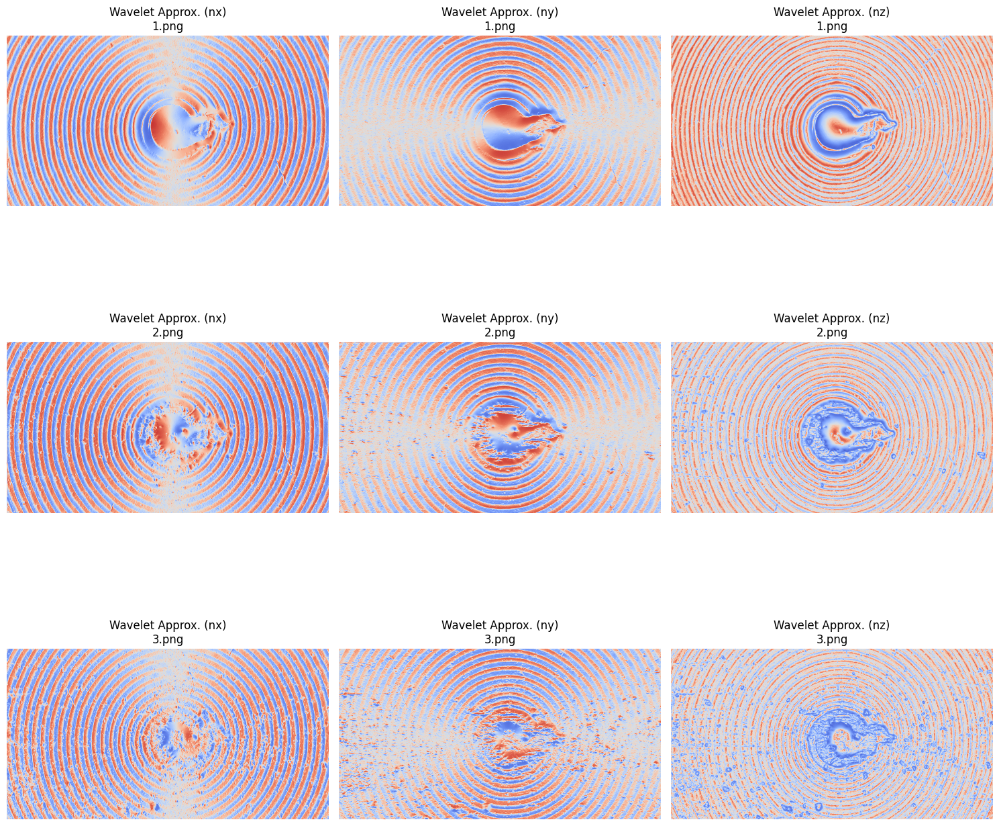

AttributeError: type object 'GraphPlotter' has no attribute 'plot_fft_magnitude'

<Figure size 640x480 with 0 Axes>

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import glob
import os
from scipy.fft import fft2, fftshift, ifft2, ifftshift
import pywt
from skimage.measure import shannon_entropy
from sklearn.decomposition import PCA
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# ============================
# Constants and Settings
# ============================
FILE_PATTERN = "[1-3].png"  # Looks for "1.png", "2.png", and "3.png"
BINS = 1000  # More bins for finer detail

# Colors for plotting histograms
COLOR_ELEVATION = 'skyblue'
COLOR_AZIMUTH = 'salmon'
COLOR_X = 'orchid'
COLOR_Y = 'gold'
COLOR_Z = 'lightgreen'

# Wavelet parameters
WAVELET_NAME = 'db4'
WAVELET_LEVEL = 2  # More levels for more coefficients

# FFT filter parameters (example)
LOW_CUTOFF_FREQ = 10
HIGH_CUTOFF_FREQ = 50

# Wear simulation parameters (conceptual)
WEAR_LEVELS = [0, 150, 300]  # mm
NORMAL_FORCE_G = 200  # g
NORMAL_FORCE_N = NORMAL_FORCE_G * 9.81 / 1000  # Convert grams to Newtons
WEAR_COEFFICIENT = 1e-6
HARDNESS = 100
SLIDING_DISTANCE = 100

# ============================
# Class: NormalMap
# ============================
class NormalMap:
    """
    Process a normal map image:
      - Loads the image and converts it from BGR to RGB.
      - Normalizes pixel values to the range [-1,1].
      - Extracts the x, y, z components.
      - Computes spherical coordinates:
          theta: elevation angle (in radians and degrees)
          phi: azimuth angle in the x-y plane [-pi, pi]
    """
    def __init__(self, file_path: str):
        self.file_path = file_path
        self.img = None          # Original RGB image
        self.normals = None      # Normalized image (values in [-1, 1])
        self.nx = None           # X component
        self.ny = None           # Y component
        self.nz = None           # Z component
        self.theta = None        # Elevation (radians)
        self.phi = None          # Azimuth (radians)
        self.theta_deg = None    # Elevation in degrees
        self.phi_deg = None      # Azimuth in degrees
        self.fft_result = None   # FFT (complex array)
        self.fft_magnitude = None # FFT magnitude spectrum
        self.wavelet_coeffs = None # Wavelet coefficients

    def load_and_normalize(self) -> None:
        """Load image, convert to RGB, and normalize pixel values to [-1, 1]."""
        img = cv2.imread(self.file_path, cv2.IMREAD_COLOR)
        if img is None:
            raise IOError(f"Image not found: {self.file_path}")
        self.img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_float = self.img.astype(np.float32) / 255.0
        self.normals = img_float * 2.0 - 1.0

    @staticmethod
    def normalize_vectors(nx: np.ndarray, ny: np.ndarray, nz: np.ndarray) -> tuple:
        """Normalize vector components to unit length."""
        magnitude = np.sqrt(nx**2 + ny**2 + nz**2)
        magnitude[magnitude == 0] = 1.0  # avoid division by zero
        return nx / magnitude, ny / magnitude, nz / magnitude

    @staticmethod
    def compute_spherical(nx: np.ndarray, ny: np.ndarray, nz: np.ndarray) -> tuple:
        """
        Compute spherical coordinates:
          - theta: angle between vertical (z) and the normal [0, pi]
          - phi: azimuth angle in the x-y plane [-pi, pi]
        """
        theta = np.arccos(nz)
        phi = np.arctan2(ny, nx)
        return theta, phi

    def perform_fft(self) -> None:
        """Perform 2D FFT on the normal components."""
        self.fft_result = {}
        self.fft_magnitude = {}
        for component_name, component_data in zip(['nx', 'ny', 'nz'],
                                                    [self.nx, self.ny, self.nz]):
            if component_data is not None:
                fft_result = fft2(component_data)
                self.fft_result[component_name] = fft_result
                fft_shifted = fftshift(np.abs(fft_result))
                self.fft_magnitude[component_name] = np.log(1 + fft_shifted)

    def apply_fft_filter(self, component_name: str,
                         low_cutoff: int = LOW_CUTOFF_FREQ,
                         high_cutoff: int = HIGH_CUTOFF_FREQ) -> np.ndarray:
        """Apply a bandpass filter in the frequency domain."""
        if component_name not in self.fft_result:
            return None
        fft_shifted = fftshift(self.fft_result[component_name])
        rows, cols = fft_shifted.shape
        crow, ccol = rows // 2, cols // 2

        mask = np.zeros_like(fft_shifted, dtype=bool)
        for i in range(rows):
            for j in range(cols):
                d = np.sqrt((i - crow)**2 + (j - ccol)**2)
                if low_cutoff <= d <= high_cutoff:
                    mask[i, j] = True

        filtered_fft_shifted = fft_shifted * mask
        filtered_fft = ifftshift(filtered_fft_shifted)
        filtered_image = np.real(ifft2(filtered_fft))
        return filtered_image

    def perform_wavelet_analysis(self, level: int = WAVELET_LEVEL) -> None:
        """Perform multi-level 2D Discrete Wavelet Transform."""
        self.wavelet_coeffs = {}
        for component_name, component_data in zip(['nx', 'ny', 'nz'],
                                                    [self.nx, self.ny, self.nz]):
            if component_data is not None:
                coeffs = pywt.wavedec2(component_data, WAVELET_NAME, level=level, mode='periodization')
                self.wavelet_coeffs[component_name] = coeffs

    def reconstruct_wavelet(self, component_name: str, detail_coeffs_to_zero=None) -> np.ndarray:
        """
        Reconstruct image from wavelet coefficients,
        optionally zeroing out specified detail coefficients.
        """
        if component_name not in self.wavelet_coeffs:
            return None
        coeffs = self.wavelet_coeffs[component_name]
        if detail_coeffs_to_zero is not None:
            new_coeffs = [coeffs[0]] + [
                (np.zeros_like(d[0]), np.zeros_like(d[1]), np.zeros_like(d[2]))
                if i in detail_coeffs_to_zero else d
                for i, d in enumerate(coeffs[1:])
            ]
            return pywt.waverec2(new_coeffs, WAVELET_NAME, mode='periodization')
        return pywt.waverec2(coeffs, WAVELET_NAME, mode='periodization')

    def process(self) -> None:
        """Execute full processing pipeline for the normal map."""
        self.load_and_normalize()
        self.nx = self.normals[..., 0]
        self.ny = self.normals[..., 1]
        self.nz = self.normals[..., 2]
        self.nx, self.ny, self.nz = NormalMap.normalize_vectors(self.nx, self.ny, self.nz)
        self.theta, self.phi = NormalMap.compute_spherical(self.nx, self.ny, self.nz)
        self.theta_deg = np.degrees(self.theta)
        self.phi_deg = np.degrees(self.phi)
        self.perform_fft()
        self.perform_wavelet_analysis()

    def calculate_iso_25178_parameters(self) -> dict:
        """Calculate ISO 25178 surface parameters (adapted for normal maps)."""
        parameters = {}
        if self.nx is not None and self.ny is not None:
            Sdq = np.sqrt(np.mean(self.nx**2 + self.ny**2))
            parameters['Sdq'] = Sdq

        if self.theta_deg is not None and self.phi_deg is not None:
            parameters['Std_Elevation'] = np.std(self.theta_deg)
            parameters['Std_Azimuth'] = np.std(self.phi_deg)
        return parameters

# ============================
# Class: GraphPlotter
# ============================
class GraphPlotter:
    """
    A collection of static methods to plot:
      - Normal map images with elevation and azimuth histograms.
      - Component histograms (x, y, z).
      - FFT and Wavelet analysis results.
      - ISO 25178 parameter analysis.
      - Comparison of wavelet coefficients.
      - **PCA analysis for further insight.**
    """
    @staticmethod
    def get_global_min_max_y(normal_maps, hist_type):
        """Determine global y-axis limits for consistent histogram scales."""
        max_density = 0
        if hist_type == 'elevation':
            for nm in normal_maps:
                hist, _ = np.histogram(nm.theta_deg.flatten(), bins=BINS, density=True)
                max_density = max(max_density, np.max(hist))
        elif hist_type == 'azimuth':
            for nm in normal_maps:
                hist, _ = np.histogram(nm.phi_deg.flatten(), bins=BINS, density=True)
                max_density = max(max_density, np.max(hist))
        elif hist_type == 'x':
            for nm in normal_maps:
                hist, _ = np.histogram(nm.nx.flatten(), bins=BINS, density=True)
                max_density = max(max_density, np.max(hist))
        elif hist_type == 'y':
            for nm in normal_maps:
                hist, _ = np.histogram(nm.ny.flatten(), bins=BINS, density=True)
                max_density = max(max_density, np.max(hist))
        elif hist_type == 'z':
            for nm in normal_maps:
                hist, _ = np.histogram(nm.nz.flatten(), bins=BINS, density=True)
                max_density = max(max_density, np.max(hist))
        max_density *= 1.15  # Buffer for visualization
        return (0, max_density)

    @staticmethod
    def plot_normal_map_histograms(normal_maps: list) -> None:
        """Figure 1: Display each normal map with elevation and azimuth histograms."""
        n_images = len(normal_maps)
        fig, axs = plt.subplots(n_images, 3, figsize=(15, 5 * n_images))
        if n_images == 1:
            axs = np.expand_dims(axs, axis=0)

        elev_ylim = GraphPlotter.get_global_min_max_y(normal_maps, 'elevation')
        azim_ylim = GraphPlotter.get_global_min_max_y(normal_maps, 'azimuth')
        global_max_y = max(elev_ylim[1], azim_ylim[1])
        angle_ylim = (0, global_max_y)

        # Determine consistent zoom for images
        all_heights = []
        all_widths = []
        for nm in normal_maps:
            h, w, _ = nm.img.shape
            all_heights.append(h)
            all_widths.append(w)
        max_height = max(all_heights)
        max_width = max(all_widths)

        for idx, nm in enumerate(normal_maps):
            filename = os.path.basename(nm.file_path)
            # Image display
            ax_img = axs[idx, 0]
            ax_img.imshow(nm.img)
            ax_img.set_title(f"Normal Map\n{filename}")
            h, w, _ = nm.img.shape
            x_center = w / 2
            y_center = h / 2
            ax_img.set_xlim(x_center - max_width/2, x_center + max_width/2)
            ax_img.set_ylim(y_center + max_height/2, y_center - max_height/2)  # Inverted y-axis
            ax_img.set_aspect('equal')
            ax_img.axis("off")

            # Elevation histogram
            ax_elev = axs[idx, 1]
            ax_elev.hist(nm.theta_deg.flatten(), bins=BINS, density=True,
                         color=COLOR_ELEVATION, edgecolor='black', alpha=0.7)
            ax_elev.set_xlabel("Elevation Angle (°)")
            ax_elev.set_ylabel("Probability Density")
            ax_elev.set_title(f"Elevation Distribution - {filename}")
            ax_elev.set_xlim(0, 180)
            ax_elev.set_ylim(*angle_ylim)
            ax_elev.grid(True, alpha=0.3)
            ax_elev.axvline(np.mean(nm.theta_deg), color='black', linestyle='--', linewidth=1,
                            label=f'Mean: {np.mean(nm.theta_deg):.1f}°')
            ax_elev.axvline(np.median(nm.theta_deg), color='gray', linestyle=':', linewidth=1,
                            label=f'Median: {np.median(nm.theta_deg):.1f}°')
            ax_elev.legend()

            # Azimuth histogram
            ax_azim = axs[idx, 2]
            ax_azim.hist(nm.phi_deg.flatten(), bins=BINS, density=True,
                         color=COLOR_AZIMUTH, edgecolor='black', alpha=0.7)
            ax_azim.set_xlabel("Azimuth Angle (°)")
            ax_azim.set_ylabel("Probability Density")
            ax_azim.set_title(f"Azimuth Distribution - {filename}")
            ax_azim.set_xlim(-180, 180)
            ax_azim.set_ylim(*angle_ylim)
            ax_azim.grid(True, alpha=0.3)
            ax_azim.axvline(np.mean(nm.phi_deg), color='black', linestyle='--', linewidth=1,
                            label=f'Mean: {np.mean(nm.phi_deg):.1f}°')
            ax_azim.axvline(np.median(nm.phi_deg), color='gray', linestyle=':', linewidth=1,
                            label=f'Median: {np.median(nm.phi_deg):.1f}°')
            ax_azim.legend()

        plt.tight_layout()
        plt.show()

    @staticmethod
    def plot_component_histograms(normal_maps: list) -> None:
        """Figure 2: Plot histograms for x, y, and z components."""
        n_images = len(normal_maps)
        fig, axs = plt.subplots(n_images, 3, figsize=(15, 5 * n_images))
        if n_images == 1:
            axs = np.expand_dims(axs, axis=0)

        x_ylim = GraphPlotter.get_global_min_max_y(normal_maps, 'x')
        y_ylim = GraphPlotter.get_global_min_max_y(normal_maps, 'y')
        z_ylim = GraphPlotter.get_global_min_max_y(normal_maps, 'z')
        global_max_y = max(x_ylim[1], y_ylim[1], z_ylim[1])
        component_ylim = (0, global_max_y)

        for idx, nm in enumerate(normal_maps):
            filename = os.path.basename(nm.file_path)
            # X component
            ax_x = axs[idx, 0]
            ax_x.hist(nm.nx.flatten(), bins=BINS, density=True,
                      color=COLOR_X, edgecolor='black', alpha=0.7)
            ax_x.set_xlabel("X Component")
            ax_x.set_ylabel("Probability Density")
            ax_x.set_title(f"X Distribution - {filename}")
            ax_x.set_xlim(-1, 1)
            ax_x.set_ylim(*component_ylim)
            ax_x.grid(True, alpha=0.3)
            ax_x.axvline(np.mean(nm.nx), color='black', linestyle='--', linewidth=1,
                         label=f'Mean: {np.mean(nm.nx):.2f}')
            ax_x.axvline(np.median(nm.nx), color='gray', linestyle=':', linewidth=1,
                         label=f'Median: {np.median(nm.nx):.2f}')
            ax_x.legend()

            # Y component
            ax_y = axs[idx, 1]
            ax_y.hist(nm.ny.flatten(), bins=BINS, density=True,
                      color=COLOR_Y, edgecolor='black', alpha=0.7)
            ax_y.set_xlabel("Y Component")
            ax_y.set_ylabel("Probability Density")
            ax_y.set_title(f"Y Distribution - {filename}")
            ax_y.set_xlim(-1, 1)
            ax_y.set_ylim(*component_ylim)
            ax_y.grid(True, alpha=0.3)
            ax_y.axvline(np.mean(nm.ny), color='black', linestyle='--', linewidth=1,
                         label=f'Mean: {np.mean(nm.ny):.2f}')
            ax_y.axvline(np.median(nm.ny), color='gray', linestyle=':', linewidth=1,
                         label=f'Median: {np.median(nm.ny):.2f}')
            ax_y.legend()

            # Z component
            ax_z = axs[idx, 2]
            ax_z.hist(nm.nz.flatten(), bins=BINS, density=True,
                      color=COLOR_Z, edgecolor='black', alpha=0.7)
            ax_z.set_xlabel("Z Component")
            ax_z.set_ylabel("Probability Density")
            ax_z.set_title(f"Z Distribution - {filename}")
            ax_z.set_xlim(-1, 1)
            ax_z.set_ylim(*component_ylim)
            ax_z.grid(True, alpha=0.3)
            ax_z.axvline(np.mean(nm.nz), color='black', linestyle='--', linewidth=1,
                         label=f'Mean: {np.mean(nm.nz):.2f}')
            ax_z.axvline(np.median(nm.nz), color='gray', linestyle=':', linewidth=1,
                         label=f'Median: {np.median(nm.nz):.2f}')
            ax_z.legend()

        plt.tight_layout()
        plt.show()

    @staticmethod
    def plot_wavelet_analysis(normal_maps: list) -> None:
        """Figure 5: Plot the wavelet approximation coefficients."""
        n_images = len(normal_maps)
        fig, axs = plt.subplots(n_images, 3, figsize=(15, 5 * n_images))
        if n_images == 1:
            axs = np.expand_dims(axs, axis=0)
        for idx, nm in enumerate(normal_maps):
            filename = os.path.basename(nm.file_path)
            for i, component in enumerate(['nx', 'ny', 'nz']):
                ax = axs[idx, i]
                if nm.wavelet_coeffs and component in nm.wavelet_coeffs:
                    coeffs = nm.wavelet_coeffs[component]
                    LL = coeffs[0]
                    ax.imshow(LL, cmap='coolwarm')
                    ax.set_title(f"Wavelet Approx. ({component})\n{filename}")
                    ax.axis('off')
                else:
                    ax.set_title(f"Wavelet Data Missing ({component})\n{filename}")
                    ax.axis('off')
        plt.tight_layout()
        plt.show()

    @staticmethod
    def display_iso_25178_parameters(normal_maps: list) -> None:
        """Print ISO 25178 parameters for each normal map."""
        print("\n==================== ISO 25178 Parameter Analysis ====================")
        for nm in normal_maps:
            filename = os.path.basename(nm.file_path)
            parameters = nm.calculate_iso_25178_parameters()
            print(f"\n--- {filename} ---")
            for key, value in parameters.items():
                print(f"  {key}: {value:.4f}")
        print("========================================================================")

    @staticmethod
    def plot_wavelet_difference(normal_maps: list) -> None:
        """Compare wavelet approximation coefficients between consecutive frames."""
        if len(normal_maps) < 2:
            print("Need at least two normal maps to compare wavelet coefficients.")
            return
        num_frames = len(normal_maps)
        fig, axs = plt.subplots(num_frames - 1, 3, figsize=(15, 5 * (num_frames - 1)))
        if num_frames == 2:
            axs = np.expand_dims(axs, axis=0)
        for i in range(num_frames - 1):
            nm1 = normal_maps[i]
            nm2 = normal_maps[i+1]
            filename1 = os.path.basename(nm1.file_path)
            filename2 = os.path.basename(nm2.file_path)
            for j, component in enumerate(['nx', 'ny', 'nz']):
                if (nm1.wavelet_coeffs and component in nm1.wavelet_coeffs and
                    nm2.wavelet_coeffs and component in nm2.wavelet_coeffs):
                    ll1 = nm1.wavelet_coeffs[component][0]
                    ll2 = nm2.wavelet_coeffs[component][0]
                    difference = ll2 - ll1
                    ax = axs[i, j]
                    im = ax.imshow(difference, cmap='coolwarm')
                    ax.set_title(f"Diff. LL ({component})\n{filename2} - {filename1}")
                    ax.axis('off')
                    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
                else:
                    ax = axs[i, j]
                    ax.set_title(f"Wavelet Data Missing ({component})\n{filename2} vs {filename1}")
                    ax.axis('off')
        plt.tight_layout()
        plt.show()

    @staticmethod
    def plot_pca_analysis(normal_maps: list) -> None:
        """
        Figure 6: Perform PCA on the normal vector data and plot:
          - A bar chart of the explained variance ratio for each principal component.
          - A scatter plot of a random sample of data projected onto the first two principal components.
        """
        n_images = len(normal_maps)
        fig, axs = plt.subplots(n_images, 2, figsize=(12, 5 * n_images))
        if n_images == 1:
            axs = np.expand_dims(axs, axis=0)
        for idx, nm in enumerate(normal_maps):
            filename = os.path.basename(nm.file_path)
            # Prepare the data: flatten the normal vectors into shape (num_pixels, 3)
            h, w = nm.nx.shape
            data = np.stack((nm.nx.flatten(), nm.ny.flatten(), nm.nz.flatten()), axis=1)
            # Perform PCA
            pca = PCA(n_components=3)
            pca.fit(data)
            explained_variance = pca.explained_variance_ratio_
            # Bar plot for explained variance ratio
            ax_bar = axs[idx, 0]
            components = np.arange(1, 4)
            ax_bar.bar(components, explained_variance, color='teal', alpha=0.7)
            ax_bar.set_title(f"PCA Explained Variance\n{filename}")
            ax_bar.set_xlabel("Principal Component")
            ax_bar.set_ylabel("Explained Variance Ratio")
            ax_bar.set_xticks(components)
            ax_bar.set_ylim(0, 1)
            
            # Scatter plot for the first two principal components
            ax_scatter = axs[idx, 1]
            # Sample a subset of the data for clarity (up to 1000 points)
            sample_idx = np.random.choice(data.shape[0], size=min(1000, data.shape[0]), replace=False)
            data_sample = data[sample_idx]
            projected = pca.transform(data_sample)
            ax_scatter.scatter(projected[:, 0], projected[:, 1], s=1, alpha=0.5, color='purple')
            ax_scatter.set_title(f"PCA Scatter (PC1 vs PC2)\n{filename}")
            ax_scatter.set_xlabel("PC1")
            ax_scatter.set_ylabel("PC2")
            ax_scatter.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

# ============================
# Main Script
# ============================
def main():
    # Find all files matching the file pattern.
    normal_map_files = glob.glob(FILE_PATTERN)
    if len(normal_map_files) < 1:
        raise IOError(f"No normal map images found matching pattern '{FILE_PATTERN}'.")
    # Sort files numerically (assumes names like "1.png", "2.png", etc.)
    normal_map_files = sorted(normal_map_files, key=lambda f: int(os.path.splitext(os.path.basename(f))[0]))
    print(f"Found {len(normal_map_files)} normal map files: {normal_map_files}")
    normal_maps = []
    first_normal_map = None
    for file in normal_map_files:
        try:
            print(f"Processing {file}...")
            nm = NormalMap(file)
            nm.process()
            normal_maps.append(nm)
            if file == "1.png":
                first_normal_map = nm
            print(f"  - Shape: {nm.img.shape}")
            print(f"  - Average elevation: {np.mean(nm.theta_deg):.2f}° (Median: {np.median(nm.theta_deg):.2f}°)")
            print(f"  - Average azimuth: {np.mean(nm.phi_deg):.2f}° (Median: {np.median(nm.phi_deg):.2f}°)")
        except Exception as e:
            print(f"Error processing {file}: {e}")
    if not normal_maps:
        print("No valid normal maps to process.")
        return
    print(f"\nSuccessfully processed {len(normal_maps)} normal maps. Generating figures...")
    output_dir = "normal_map_analysis_figures"
    os.makedirs(output_dir, exist_ok=True)
    plt.rcParams['savefig.dpi'] = 300
    plt.rcParams['figure.autolayout'] = True

    GraphPlotter.plot_normal_map_histograms(normal_maps)
    plt.savefig(os.path.join(output_dir, "figure1_normal_map_histograms.png"))
    
    GraphPlotter.plot_component_histograms(normal_maps)
    plt.savefig(os.path.join(output_dir, "figure2_component_histograms.png"))
    
    GraphPlotter.plot_wavelet_analysis(normal_maps)
    plt.savefig(os.path.join(output_dir, "figure5_wavelet_approximation.png"))
    
    GraphPlotter.plot_fft_magnitude(normal_maps)
    plt.savefig(os.path.join(output_dir, "figure4_fft_magnitude.png"))
    
    GraphPlotter.display_iso_25178_parameters(normal_maps)
    GraphPlotter.plot_wavelet_difference(normal_maps)
    
    # New PCA analysis chart
    GraphPlotter.plot_pca_analysis(normal_maps)
    plt.savefig(os.path.join(output_dir, "figure6_pca_analysis.png"))

if __name__ == "__main__":
    main()
